<a href="https://colab.research.google.com/github/adarsh415/CNN_For_Image_Recog/blob/master/Video_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 Video Classification using CNN+LSTM

In [ ]:
import tensorflow.keras as keras
import tensorflow.keras.layers as layers
import tensorflow as tf
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
tf.get_logger().setLevel('INFO')
np.random.seed(42)

In [ ]:
import os
import pathlib
import shutil

In [ ]:
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF101/UCF101.rar

--2023-03-27 11:15:13--  https://www.crcv.ucf.edu/data/UCF101/UCF101.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 6932971618 (6.5G) [application/rar]
Saving to: ‘UCF101.rar’

UCF101.rar          100%[===================>]   6.46G  70.1MB/s    in 1m 43s  

2023-03-27 11:16:57 (64.1 MB/s) - ‘UCF101.rar’ saved [6932971618/6932971618]



In [ ]:
"""
 Helper function to delete non empty directory in colab
"""

import glob
def rrmdir(path):
    for entry in os.scandir(path):
        if entry.is_dir():
            rrmdir(entry)
        else:
            os.remove(entry)
    os.rmdir(path)

In [ ]:

#rrmdir('training_data_videos')
#rrmdir('UCF-101')

In [ ]:
!unrar x UCF101.rar >> logs.txt

In [ ]:
action_categories = [ "ApplyEyeMakeup", "ApplyLipstick", "Archery", "BabyCrawling", "BalanceBeam", "BandMarching"] #, "BaseballPitch", "BasketballShooting", "BasketballDunk", "BenchPress"]# "Biking", "BilliardsShot", "BlowDryHair", "BlowingCandles", "BodyWeightSquats", "Bowling"] # "Boxing-PunchingBag", "BoxingSpeedBag", "Breaststroke", "BrushingTeeth", "CleanAndJerk", "CliffDiving", "CricketBowling", "CricketShot", "CuttingInKitchen", "Diving", "Drumming", "Fencing", "FieldHockeyPenalty", "FloorGymnastics", "FrisbeeCatch", "FrontCrawl", "GolfSwing", "Haircut", "HammerThrow", "Hammering", "HandstandPushups", "HandstandWalking", "HeadMassage", "HighJump", "HorseRace", "HorseRiding", "HulaHoop", "IceDancing", "JavelinThrow", "JugglingBalls", "JumpRope", "JumpingJack", "Kayaking", "Knitting", "LongJump", "Lunges", "MilitaryParade", "MixingBatter", "MoppingFloor", "Nunchucks", "ParallelBars", "PizzaTossing", "PlayingGuitar", "PlayingPiano", "PlayingTabla", "PlayingViolin", "PlayingCello", "PlayingDaf", "PlayingDhol", "PlayingFlute", "PlayingSitar", "PoleVault", "PommelHorse", "PullUps", "Punch", "PushUps", "Rafting", "RockClimbingIndoor", "RopeClimbing", "Rowing", "SalsaSpins", "ShavingBeard", "Shotput", "SkateBoarding", "Skiing", "Skijet", "SkyDiving", "SoccerJuggling", "SoccerPenalty", "StillRings", "SumoWrestling", "Surfing", "Swing", "TableTennisShot", "TaiChi", "TennisSwing", "ThrowDiscus", "TrampolineJumping", "Typing", "UnevenBars", "VolleyballSpiking", "WalkingWithDog", "WallPushups", "WritingOnBoard", "YoYo"]

#####Considering on 6 action classes dues to memory constrained in colab

In [ ]:
len(action_categories)

6

######BASE_VIDEO_DIR is the location where we are going to split the videos from each category into trai, test and valid. later tf.data api will pick up the vidoe from this location for further processing according to mode i.e train, valid or test

In [ ]:
BASE_VIDEO_DIR = 'training_data_videos'

In [ ]:
def createSplitForProcessing(baseDirName = BASE_VIDEO_DIR):
  data_split = {'train' : 15, 'test' :20, 'validation' : 25}
  new_base = pathlib.Path(baseDirName)
  for root, dirs, files in os.walk('UCF-101'):
    for dir in dirs:
      #print(dir)
      filePaths = glob.glob(os.path.join(root,dir) + '/*.avi')
      #print(filePaths)
      train_path = filePaths[:data_split['train']]
      test_path = filePaths[data_split['train'] : data_split['test']]
      valid_path = filePaths[data_split['test'] : data_split['validation']]

      newDirTrain = new_base / pathlib.Path("train") / dir
      if not os.path.exists(newDirTrain):
        os.makedirs(newDirTrain)
      for p in train_path:
        shutil.copyfile(src=p, dst=newDirTrain / p.split('/')[-1])
        #captureFrameAndSave(p, str(newDirTrain))

      newDirTest = new_base / pathlib.Path('test') / dir
      if not os.path.exists(newDirTest):
        os.makedirs(newDirTest)
      
      for p in test_path:
        shutil.copyfile(src=p, dst=newDirTest / p.split('/')[-1])
        #captureFrameAndSave(p, str(newDirTest))

      newDirValid = new_base / pathlib.Path('valid') / dir
      if not os.path.exists(newDirValid):
        os.makedirs(newDirValid)
      
      for p in valid_path:
        shutil.copyfile(src=p, dst=newDirValid / p.split('/')[-1])
        #captureFrameAndSave(p, str(newDirValid))
  print("Split completed!!")

In [ ]:
createSplitForProcessing()

Split completed!!


##### captureFrame() method read the vidoes from given path and captures 30 frames per video and stores in the array of shape [frame_num, H, W, C] 

In [ ]:
def captureFrame(videoPath, numberOfFrame=30):
  capture = cv2.VideoCapture(videoPath)
  frameCount = 0
  result = np.zeros(shape=(numberOfFrame, 224,224,3))
  while frameCount < numberOfFrame:
    ret, frame = capture.read()
    if not ret:
      break
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image,(224,224)).astype("float32")
    result[frameCount] = image
    frameCount += 1
  return result

##### Below class is the generator that will be used by tf.data api for training , testing and validation.
##### it calls captureFrame() method, on each video in directory maintains dictionary of label -> interger encoding and vise versa so that while inference time we can easily map the interger label to string label.

In [ ]:
class create_dataset_generator:
  def __init__(self, base_video_dir, model_mode, numberOfFrame):
    self.base_video_dir = base_video_dir
    self.model_mode = model_mode
    self.base_dir = os.path.join(self.base_video_dir, self.model_mode, '*/', '*.avi')
    self.file_list = [path for path in glob.glob(self.base_dir) if path.split('/')[2] in action_categories]
    self.classes = list(set([p.split('/')[2] for p in self.file_list]))
    self.classes_to_ids = dict((c, i) for i, c in enumerate(self.classes))
    self.ids_to_classes = dict((i, c) for i, c in enumerate(self.classes))
    self.numberOfFrame = numberOfFrame

  def __call__(self):
    # pairs = list(zip(self.file_list, self.classes))
    if self.model_mode == 'train':
      import random
      random.shuffle(self.file_list)
    for path in self.file_list:
      name = path.split('/')[2]
      image = captureFrame(path, self.numberOfFrame)
      label = self.classes_to_ids[name]
      yield image, label

In [ ]:
from google.colab.patches import cv2_imshow

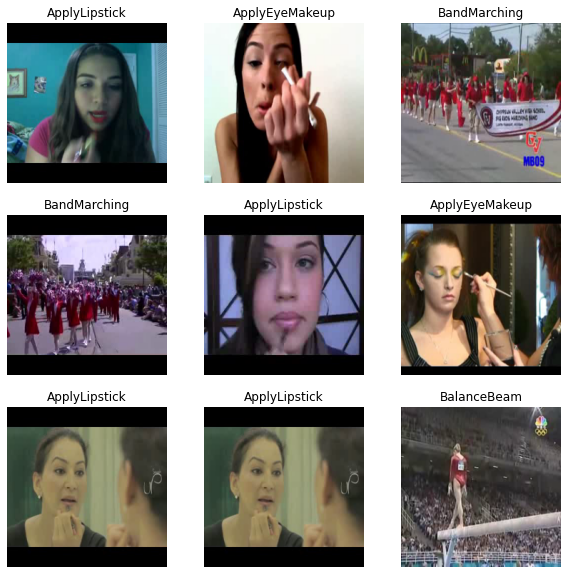

In [ ]:
frame = create_dataset_generator(BASE_VIDEO_DIR, 'train', 30)
plt.figure(figsize=(10, 10))
for i in range(9):
  frames, labels = next(frame())
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(frames[0].astype("uint8"))
  plt.title(frame.ids_to_classes[labels])
  plt.axis("off")

In [ ]:
output_signature = (tf.TensorSpec(shape = (None, None, None, 3), dtype = tf.float32),
                    tf.TensorSpec(shape = (), dtype = tf.int16))

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
BATCH_SIZE= 16 # could not experiment with batch size greater tha 16 dues to memory issue in colab

In [ ]:
# tf.data object to load training videos and labels
train_iter = create_dataset_generator(BASE_VIDEO_DIR, 'train', 30)
train_ds = tf.data.Dataset.from_generator(train_iter, output_signature = output_signature)
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.cache().shuffle(20) # larger value for shuffle was making colab crash due to memory issue

In [ ]:
valid_ds = tf.data.Dataset.from_generator(create_dataset_generator(BASE_VIDEO_DIR, 'valid', 30), output_signature = output_signature)
valid_ds = valid_ds.batch(BATCH_SIZE)
valid_ds = valid_ds.cache().shuffle(20)


Above is validation set 

Below is testing set

```
# This is formatted as code
```



In [ ]:
test_iter = create_dataset_generator(BASE_VIDEO_DIR, 'test', 30)
test_ds = tf.data.Dataset.from_generator(test_iter, output_signature = output_signature)
test_ds = test_ds.batch(BATCH_SIZE)
test_ds = test_ds.cache()#.prefetch(buffer_size = AUTOTUNE)

I have used Xception pretrained model for CNN encoder part which requires image shape of (224,224,3), this model freezed and top was excluded

83683744/83683744 [==============================] - 1s 0us/step


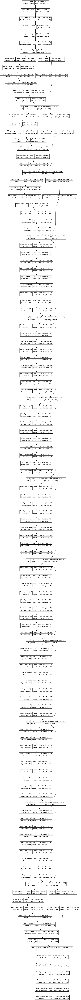

In [ ]:
conv_base = keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False
)
conv_base.trainable = False
#conv_base.summary()
keras.utils.plot_model(conv_base, 'Xception_model_without_top.png', show_shapes=True)

In [ ]:
# Exponential Learning rate scheduler used to find the approriate learning rate, once optimum rate was found, it was disabled during final model training.
def scheduler(epoch, lr):
  k = 0.1
  return lr * tf.math.exp(-k*epoch)

# make sure Tensorboard log dir exists and cleaned up
if not os.path.exists('Tensorlog'):
  os.mkdir('Tensorlog')
else:
  rrmdir('Tensorlog')
  os.mkdir('Tensorlog')

# callbacks
callbacks = [
    keras.callbacks.ModelCheckpoint(      
        filepath = 'video_classfication.keras',
        save_best_only = True,
        monitor = 'val_loss'
  ),
  keras.callbacks.EarlyStopping(
      patience=5,
      min_delta=0.02,
      restore_best_weights=True,
      start_from_epoch=15
  ),
  #keras.callbacks.LearningRateScheduler(scheduler),
  keras.callbacks.ReduceLROnPlateau(factor=0.2, patience=4, verbose=1, min_lr = 0.00001), # still we need to reduce learning rate when val_loss does not change
  keras.callbacks.TensorBoard('Tensorlog') # to see cool logs in tensorboard
]

In [ ]:
"""
Image augmentation to compansate for less training images
Tried with various combination, final one are the which are not commented out.
Commented were making model underfit or overfit
"""
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.2),
        #layers.RandomTranslation((-0.2, 0.3), (-0.2, 0.3)),
        #layers.RandomContrast(0.3),
        #layers.RandomBrightness(0.2),
    ]
)

### Data augumentation is used to compensate for low training data.
As you can see below model architecture uses 2 dropout layers, one before feeding the output of 1st dense layer to LSTM and other before final output layer.
Reason for 1st dropout is that we want to model to focus on half of the feature space and 2nd dropout is make LSTM learn most important features.
It also helps in handling the overfitting.

Why 3 LSTM layers?

since many frame are coming from same video and they vary very little to each other these layers helps the model in learning special fearures about frames.

number of units in each LSTM was tuned , Units used during tuning were [300, 200, 150, 128, 64]

Why Adam?

Adam seems to be more stable and adaptive optimizer which helps in propagating the gradient smoothly.
It has many benifits above RMSpro and AdamDelta.


In [ ]:
from keras.api._v2.keras import activations
#import tf.keras.layers.TimeDistributed as TimeDistributed

inputs = keras.Input(shape=(30, 224, 224, 3)) # 30 == number of frames captured per video, each having dimension (224,224,3)
x = keras.layers.Rescaling(1./255)(inputs)
x = keras.applications.xception.preprocess_input
x = layers.TimeDistributed(data_augmentation)(inputs)
x = layers.TimeDistributed(conv_base)(x)
x = layers.TimeDistributed(layers.Flatten())(x)
encoder = layers.TimeDistributed(layers.Dense(256, activation='relu'))(x)
#x = layers.Dropout(0.3)(x)
decoder = layers.LSTM(128, return_sequences=True, recurrent_dropout=0.30)(encoder)
decoder = layers.LSTM(64, return_sequences=True, recurrent_dropout=0.30)(encoder)
#x = layers.LSTM(64, return_sequences=True)(x)
decoder = layers.LSTM(32, recurrent_dropout=0.30)(decoder) # recurrent_drop out helped in reducing overfitting
#x = layers.Dense(32)(x)
decoder = layers.Dropout(0.5)(decoder) # dropout here is needed for get rid of overfitting 
outputs = layers.Dense(6)(decoder)

model = keras.Model(inputs, outputs)
optimizer = keras.optimizers.Adam(learning_rate=0.0001) # this is the learning which found using learning scheduler to be more robust
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True) # from_logits=True since labels are integers not one-hot encoded values
model.compile(loss= loss, optimizer=optimizer, metrics=['accuracy'])

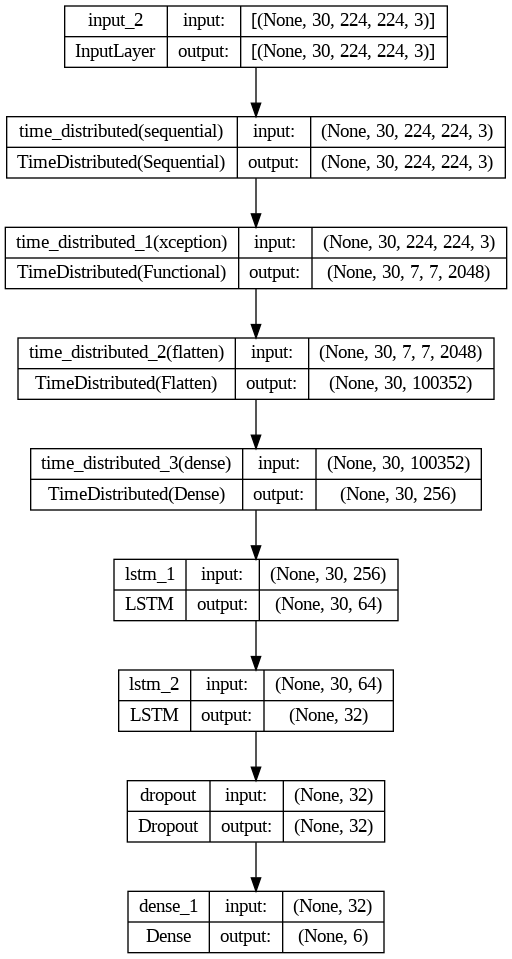

In [ ]:
keras.utils.plot_model(model, 'CNN_LSTM_BASE.png', show_shapes=True)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir 'Tensorlog'

<IPython.core.display.Javascript object>

In [ ]:
from time import perf_counter
start = perf_counter()
history = model.fit(train_ds, epochs=30, validation_data=valid_ds, callbacks=callbacks)
end = perf_counter()
print("===================End of training=============================")
print("time spent in seconds: ", end-start)

Epoch 1/30


6/6 [==============================] - 842s 140s/step - loss: 1.7913 - accuracy: 0.2222 - val_loss: 1.6778 - val_accuracy: 0.3667 - lr: 1.0000e-04
Epoch 2/30
6/6 [==============================] - 805s 148s/step - loss: 1.6923 - accuracy: 0.2333 - val_loss: 1.6410 - val_accuracy: 0.4000 - lr: 1.0000e-04
Epoch 3/30
6/6 [==============================] - 801s 139s/step - loss: 1.6171 - accuracy: 0.3222 - val_loss: 1.5724 - val_accuracy: 0.4333 - lr: 1.0000e-04
Epoch 4/30
6/6 [==============================] - 807s 140s/step - loss: 1.5777 - accuracy: 0.3667 - val_loss: 1.6073 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 5/30
6/6 [==============================] - 788s 136s/step - loss: 1.5059 - accuracy: 0.4222 - val_loss: 1.6157 - val_accuracy: 0.3333 - lr: 1.0000e-04
Epoch 6/30
6/6 [==============================] - 796s 137s/step - loss: 1.5080 - accuracy: 0.4556 - val_loss: 1.6210 - val_accuracy: 0.4333 - lr: 1.0000e-04
Epoch 7/30
6/6 [==============================] - ETA: 0s - los

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


### Loading the model for inference if notebook crashed in between inference. Due to memory issue sometimes notebook crashes if crashes load from saved checkpoint.

In [ ]:
#model = keras.models.load_model('/content/video_classfication.keras')

In [ ]:
def get_predictions(test_ds):
  true_labels = [label for _, label in test_ds.unbatch()]
  true_labels = tf.stack(true_labels, axis=0)
  predictions = model.predict(test_ds)
  predictions = np.argmax(predictions, axis=-1)
  return true_labels, predictions

In [ ]:
import seaborn as sns

In [ ]:
def plot_confusion_matrix(true_labels, predictions):
  cm = tf.math.confusion_matrix(true_labels, predictions)
  ax = sns.heatmap(cm, annot=True, fmt='g')
  sns.set(rc={'figure.figsize':(12, 12)})
  sns.set(font_scale=1.4)
  ax.set_title('Confusion matrix of action recognition for test')
  ax.set_xlabel('Predicted Action')
  ax.set_ylabel('Actual Action')
  plt.xticks(rotation=90)
  plt.yticks(rotation=0)
  ax.xaxis.set_ticklabels(range(cm.shape[0]))
  ax.yaxis.set_ticklabels(range(cm.shape[0]))

In [ ]:
true_labels, preditions = get_predictions(test_ds)

2/2 [==============================] - 31s 11s/step


In [ ]:
cm = tf.math.confusion_matrix(true_labels, preditions)
cm

<tf.Tensor: shape=(6, 6), dtype=int32, numpy=
array([[0, 1, 0, 0, 2, 2],
       [0, 0, 2, 3, 0, 0],
       [0, 3, 1, 1, 0, 0],
       [2, 1, 2, 0, 0, 0],
       [0, 0, 0, 0, 3, 2],
       [2, 0, 2, 0, 0, 1]], dtype=int32)>

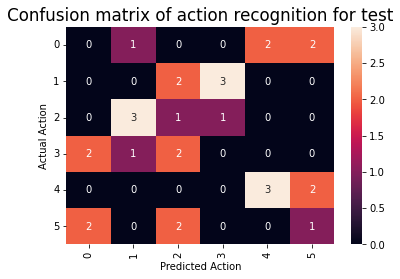

In [ ]:
plot_confusion_matrix(true_labels.numpy(), preditions)

In [ ]:
def plot_predictions(test_ds):
  true_labels = [label for _, label in test_ds.unbatch()]
  images = [img for img, _ in test_ds.unbatch()]
  print(len(images))
  true_labels = tf.stack(true_labels, axis=0)
  predictions = model.predict(test_ds)
  predictions = np.argmax(predictions, axis=-1)
  plt.figure(figsize=(12, 12))
  for i in range(9):
    augmented_image = images[i]
    ax = plt.subplot(3, 3, i + 1) 
    plt.imshow(augmented_image[0].numpy().astype("uint8"))
    plt.title('Predicted ' + test_iter.ids_to_classes[predictions[i]])
    plt.axis("off")

30
2/2 [==============================] - 3s 2s/step


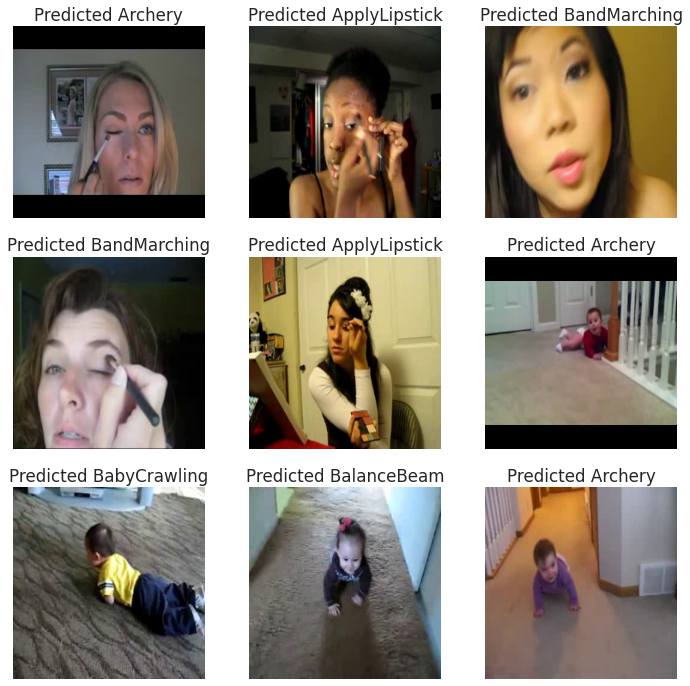

In [ ]:
plot_predictions(test_ds)


In [ ]:
!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic

In [ ]:
!jupyter nbconvert --to pdf --allow-chromium-download DL_assignment _2 _group_215_ Video_classification.ipynb